# **Exploratory data analysis of socially responsible investment opportunities into real estate of King County (WA, USA)**

<div align="center">
    <table >
     <tr>
       <td>Erin Robinson <i>(The Client)</i> is a socially responsible investor in the real estate. She wishes to improve living conditions in King County (WA, USA) by investing into the development of poor neighborhoods. </td>
        <td><img src="images/thispersondoesnotexist.jpg" width="450" alt="Erin Robinson profile pic"/></td>
     </tr>
    </table>
</div>

<center><img src="https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fi.ytimg.com%2Fvi%2FZQ9nIFQN0To%2Fmaxresdefault.jpg&f=1&nofb=1&ipt=86184f32313e4b4eb90020edc7c252cf19c97df3162bee951040f2984194a4f1&ipo=images" height="400"/></center>

>From the Client's profile, we can make the following **assumptions**:
>* The client wants to build up and renovate
>   * This implies that the property condition should be average and below
>* The client targets the properties of average tier and below, complitely *excluding* the luxorious houses. 
>* The client targets long-term goals and the timing is not very important

# The dataset

The dataset consists of Price of Houses in King County, Washington 
from sales **between May 2014 and May 2015** and was provided by [@neuefische](https://github.com/neuefische). 
Along with house price it consists of information on 18 house features, 
date of sale and ID of sale.

The dataset is based on the [`house_data`](https://www.kaggle.com/datasets/arathipraj/house-data) 
and [`house_sales`](https://www.kaggle.com/datasets/andykrause/kingcountysales) datasets on Kaggle.

| Field             | Description                                                     |
|-------------------|-----------------------------------------------------------------|
| `id`                | Unique identifier for a house                                   |
| `dateDate`          | Date the house was sold                                         |
| `pricePrice`        | Prediction target - Price                                       |
| `bedrooms`          | Number of bedrooms                                              |
| `bathrooms`         | Number of bathrooms                                             |
| `sqft_livingsquare` | Footage of the home                                             |
| `sqft_lotsquare`    | Footage of the lot                                              |
| `floorsTotal`       | Total number of floors (levels) in the house                    |
| `waterfront`        | Indicates whether the house has a view to a waterfront         |
| `view`              | Quality of the view                                             |
| `condition`         | Overall [condition](https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r#building%20condition) of the house                                  |
| `grade`             | Overall [grade](https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r#building%20grade) given to the housing unit based on the grading system |
| `sqft_above`        | Square footage of the house apart from the basement            |
| `sqft_basement`     | Square footage of the basement                                  |
| `yr_built`          | Year the house was built                                        |
| `yr_renovated`      | Year when the house was renovated                               |
| `zipcode`           | Zip code                                                        |
| `lat`               | Latitude coordinate                                             |
| `long`              | Longitude coordinate                                            |
| `sqft_living15`     | The square footage of interior housing living space for the nearest 15 neighbors |
| `sqft_lot15`        | The square footage of the land lots of the nearest 15 neighbors |

## Definition of building `grades` 


Represents the construction quality of improvements. Grades run from grade 1 to 13. Generally defined as:

|Grade|Description|
|---|---|
|1-3 |Falls short of minimum building standards. Normally cabin or inferior structure.|
|4 |Generally older, low quality construction. Does not meet code.|
|5 |Low construction costs and workmanship. Small, simple design.|
|6 |Lowest grade currently meeting building code. Low quality materials and simple designs.|
|7 |Average grade of construction and design. Commonly seen in plats and older sub-divisions.|
|8 |Just above average in construction and design. Usually better materials in both the exterior and interior finish work.|
|9 |Better architectural design with extra interior and exterior design and quality.|
|10| Homes of this quality generally have high quality features. Finish work is better and more design quality is seen in the floor plans. Generally have a larger square footage.|
|11| Custom design and higher quality finish work with added amenities of solid woods, bathroom fixtures and more luxurious options.|
|12| Custom design and excellent builders. All materials are of the highest quality and all conveniences are present.|
|13| Generally custom designed and built. Mansion level. Large amount of highest quality cabinet work, wood trim, marble, entry ways etc. |

## The analysis plan

### **Questions to ask**
1. How to define a "poor neighborhood"?
2. How does the house condition affect its price? 
3. How much renovation is worth it, if at all?

### **Hypotheses**

1. The `price` grows with the building `condition` and `grade`. *This is the basis for Erin's strategy: if this does not hold true, the investment in restoration does not make economical sense!*
    
2. The `price` is defined by surroundings: the proximity to the Seattle downtown as well as the particular `zipcode`

### *Scope*
Since there is data for only a single year, I do not conduct any time series analysis, because I believe that this is fundamentally not enough data for any reliable conclusions.

# Preparation

## Imports and global settings

In [53]:
# Imports
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

#Plotting
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.subplots as sp

from scripts.functions import *

# Settings
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()

# to display all columns in the large dataset
pd.set_option('display.max_columns', None) 

px.defaults.width = 600
px.defaults.height = 400

**DO NOT RUN THE CELL BELOW if you are running from the interactive environment**

In [2]:
pio.renderers.default = "png"

**Loading the clean data**

In [54]:
df = pd.read_csv('data/houses_processed.csv')

# Step 0. General exploration

### Geographical distribution

#### House quality (`grade`)
Let's have a look at the distribution of housing quality on the map. We'll put more weight on the low-graded houses since they are the focus of the Client.

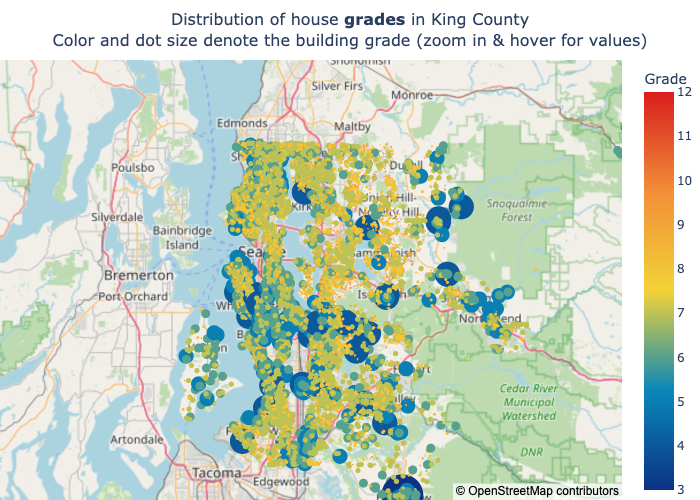

In [4]:
fig = geoplot(df, size_col='grade', color_col='grade', 
    title='Distribution of house <b>grades</b> in King County<br>Color and dot size denote the building grade (zoom in & hover for values)', 
    marker_max_size=30,
    colorscheme=px.colors.diverging.Portland)
fig.update_layout(title_font_size=16)
fig.show()

**Observations** 
* High- and low-graded houses can be found anywhere but certain areas tend to be overall better or worse. 
* The west end (the White Center peninsula) and the overall airport areas are the worst-rated
* Large districts in the north-east (around the lake Sammamish) are the most exquisite: there are sporadic poorly graded houses but mostly the grades range from 7 and higher
*  Southern areas are heterogeneous: most of the houses are quite good (`grade` ≥ 7) but there are also clusters of low-graded houses.

# Step 1. Definition of the "poor neighborhood"

So our Client is interested in improving states of the poor neighborhoods. 

### Naive approach
The first definition that comes into mind is to aggregate neighborhoods by zipcodes. Is this a sensible thing to do though?

Let's try and see.

In [5]:
df

,id,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,sale_date,price,basement_share,age,yrs_since_renovation,p_per_m2
0,7129300520,3.0,1.00,109.624675,524.897808,1.0,0,0.0,3,7,109.624675,0.000000,1955,NaN,98178,47.5112,-122.257,124.489038,524.897808,2014-10-13,221900.0,0.000000,60,NaN,2024.2
1,6414100192,3.0,2.25,238.758826,672.798216,2.0,0,0.0,3,7,201.597919,37.160907,1951,1991.0,98125,47.7210,-122.319,157.004831,709.680416,2014-12-09,538000.0,0.155642,64,24.0,2253.3
2,5631500400,2.0,1.00,71.534745,929.022668,1.0,0,0.0,3,6,71.534745,0.000000,1933,NaN,98028,47.7379,-122.233,252.694166,748.978075,2015-02-25,180000.0,0.000000,82,NaN,2516.3
3,2487200875,4.0,3.00,182.088443,464.511334,1.0,0,0.0,5,7,97.547380,84.541063,1965,NaN,98136,47.5208,-122.393,126.347083,464.511334,2014-12-09,604000.0,0.464286,50,NaN,3317.1
4,1954400510,3.0,2.00,156.075808,750.650316,1.0,0,0.0,3,8,156.075808,0.000000,1987,NaN,98074,47.6168,-122.045,167.224080,697.045708,2015-02-18,510000.0,0.000000,28,NaN,3267.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20421,263000018,3.0,2.50,142.140468,105.072464,3.0,0,0.0,3,8,142.140468,0.000000,2009,NaN,98103,47.6993,-122.346,142.140468,140.189521,2014-05-21,360000.0,0.000000,6,NaN,2532.7
20422,6600060120,4.0,2.50,214.604236,540.040877,2.0,0,0.0,3,8,214.604236,0.000000,2014,NaN,98146,47.5107,-122.362,170.011148,668.896321,2015-02-23,400000.0,0.000000,1,NaN,1863.9
20423,1523300141,2.0,0.75,94.760312,125.418060,2.0,0,0.0,3,7,94.760312,0.000000,2009,NaN,98144,47.5944,-122.299,94.760312,186.454849,2014-06-23,402101.0,0.000000,6,NaN,4243.3
20424,291310100,3.0,2.50,148.643627,221.850613,2.0,0,0.0,3,8,148.643627,0.000000,2004,NaN,98027,47.5345,-122.069,130.992196,119.565217,2015-01-16,400000.0,0.000000,11,NaN,2691.0


In [6]:
# Defining a "neighborhood" as the zipcode grouped by the 
nbhds = df.loc[:, 'grade zipcode lat long'.split()]\
           .groupby('zipcode').mean()

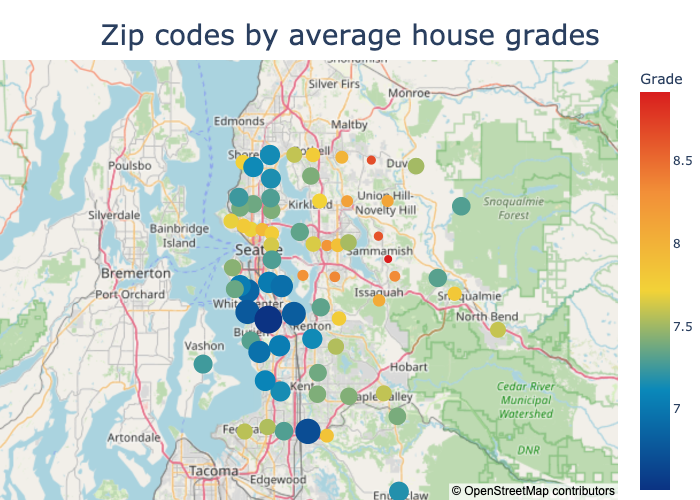

In [7]:
geoplot(nbhds, size_col='grade', color_col='grade', 
        title='Zip codes by average house grades',
        marker_max_size=20)

Building conditions

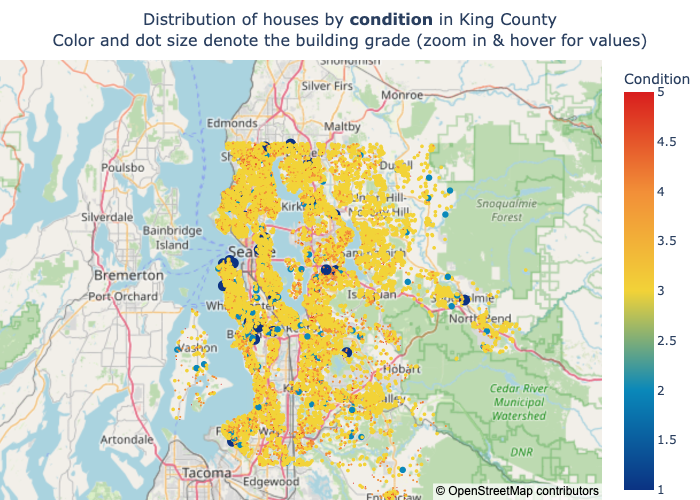

In [8]:
fig = geoplot(df, size_col='condition', color_col='condition', 
    title='Distribution of houses by <b>condition</b> in King County<br>Color and dot size denote the building grade (zoom in & hover for values)', 
    marker_max_size=8,
    colorscheme=px.colors.diverging.Portland)
fig.update_layout(title_font_size=16)
fig.show()

Sporadic houses in the bad `condition` are more or less uniformly distributed all over the county and don't aggregate. The only exception is White Center (with West Seattle, Delridge, Rainer Valley, etc.). It is historically a lowly area accomodating military personnel and immigrants [[source]](https://www.loghousemuseum.org/history/white-center/)

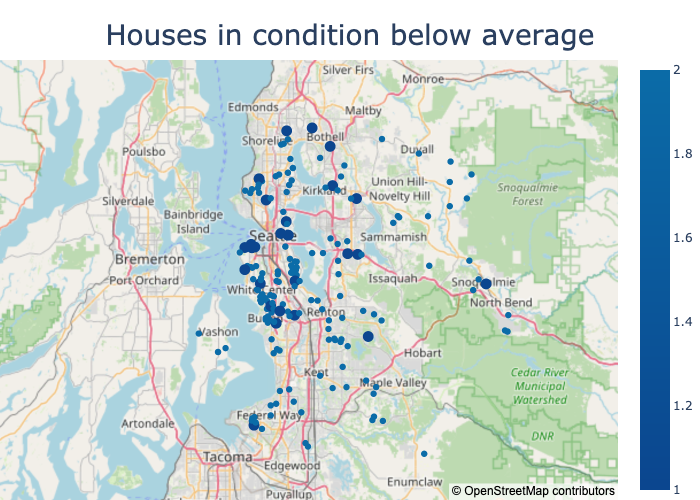

In [9]:
fig = geoplot(df[df.condition <= 2], size_col='condition', color_col='condition', 
    title='Houses in condition below average', 
    marker_max_size=8,
    colorscheme=px.colors.make_colorscale(['#0c468f', '#0b6ca8']))
fig.update_layout(coloraxis_colorbar=None)
fig.show()

Averaging condition by zipcode:

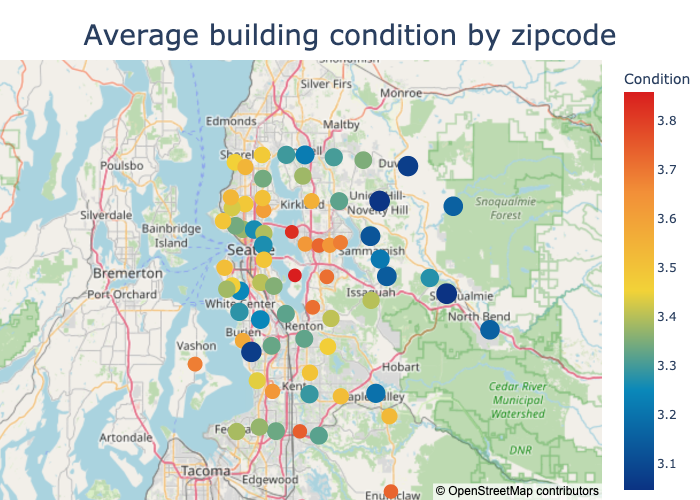

In [10]:
nbhds_cond = df.loc[:, 'condition zipcode lat long'.split()]\
           .groupby('zipcode').mean()
geoplot(nbhds_cond, size_col='condition', color_col='condition', 
        title='Average building condition by zipcode',
        marker_max_size=15)

The two maps above demonstrate the limitation of this aggregation method: the rural `zipcodes` cover much larger areas than those withi the cities, however the highly dispersed houses do not make up a *neighborhood*. This is demonstrated by *Snoquaimie Forest* in the north east. If we want to make a precise definition of a *poor neighborhood* we have to rely on proximity between the houses and identify *clusters* of low-graded houses (which will correspond to particular streets, zones, quarters very precisely). 

DBSCAN is the perfect clustering algoritm for this task. 
> DBSCAN is a density based algorithm. It views clusters as areas of high density separated by areas of low density.

### Using DBSCAN to identify poor neighborhoods

#### Limitations

* Clusters with varying density can cause problems.
  
#### Advantages

* Clusters don't need to be globular.
* Noise will not be assigned to a cluster.
* It is also stable across runs and will generate reproducible results. 
* Its very fast and can cluster very large datasets.

In [11]:
from sklearn.cluster import DBSCAN

Now let's do the following:
1. Define a "neighborhood" as a conglomeration of a minimum of 10 houses separated by the minimum of 0.006° ≈ 0.7 km
2. Define the "poor" houses as those graded 6 or below 
3. Run the clustering algorithm

In [12]:
print(f'0.005° makes up {round(geo_distance_km((47.000, 100.000), (47.000, 100.006)), 2)} km')

0.005° makes up 0.46 km


In [13]:
MINIMUM_HOUSES_IN_NEIGHBORHOOD = 10 # We require the "neighborhood" to be of minimum 10 houses. This feels right.
MAXIMUM_DISTANCE_BTW_HOUSES = 0.006 # The distance is in degrees 

In [14]:
data = df[['id', 'grade', 'lat', 'long']].drop_duplicates()
data = data.query("grade <= 6")
labels = DBSCAN(eps=MAXIMUM_DISTANCE_BTW_HOUSES, 
                min_samples=MINIMUM_HOUSES_IN_NEIGHBORHOOD,
                metric='cityblock').fit_predict(data.drop(columns=['id', 'grade']).values)
data['poor_neighborhood_id'] = labels

In [15]:
data.poor_neighborhood_id.unique() # Did clustering do anything?

array([-1,  0,  1, 25,  5,  8,  2,  9, 27,  3,  4,  6, 10,  7, 28, 34, 24,
       11, 12, 20, 22, 29, 13, 14, 15, 16, 17, 18, 19, 21, 23, 30, 31, 33,
       26, 32])

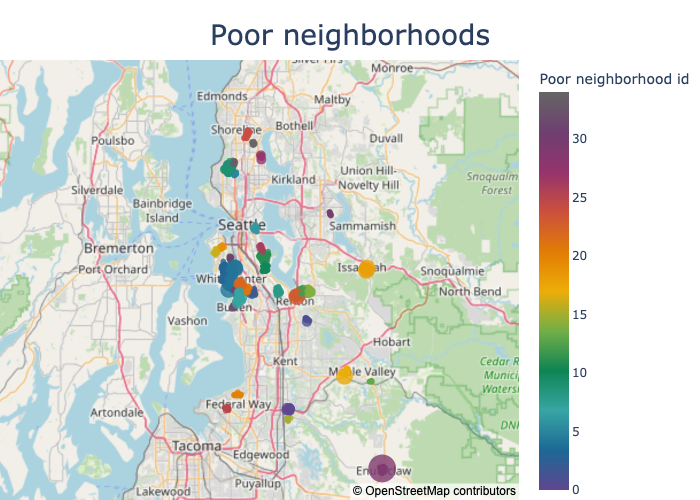

In [16]:
geoplot(data.query('poor_neighborhood_id != -1'), size_col='grade', color_col='poor_neighborhood_id', title='Poor neighborhoods', 
              marker_max_size=20, colorscheme=px.colors.qualitative.Prism, alpha=0.8)

In [17]:
target_houses = data.query('poor_neighborhood_id != -1')['id']
dft = df.loc[df.id.isin(target_houses)]
dft = pd.merge(df, data.query('poor_neighborhood_id != -1')[['id', 'poor_neighborhood_id']], on='id', how='right')

Beautiful! 

||
|--|
| With a quick cluster analysis, we identified zones in the need of improivement. In the next step, we'll learn how to price those properties in the context of the full data.|
||

---

# Step 2. Identifying factors affecting the property price

Let's get back to the full dataset and see what patterns are followed by the property price. We need to have the full picture in mind to put our selected groups into right context.

#### House `price`

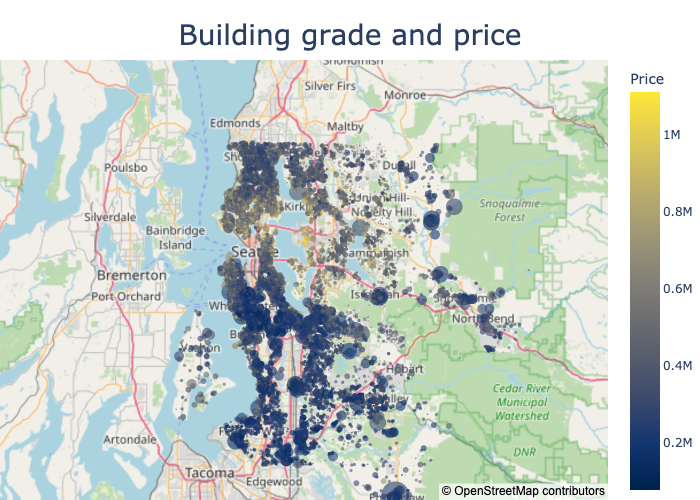

In [18]:
geoplot(df, size_col='grade', color_col='price', title='Building grade and price', 
              marker_max_size=20, colorscheme=px.colors.sequential.Cividis, alpha=0.6)

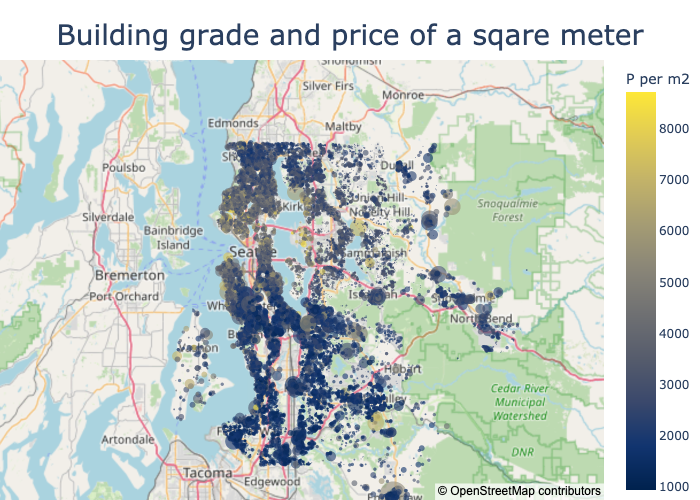

In [19]:
geoplot(df, size_col='grade', color_col='p_per_m2', title='Building grade and price of a sqare meter', 
              marker_max_size=20, colorscheme=px.colors.sequential.Cividis, alpha=0.6)

This plot shows very clear dependance of price of a square meter on the location of the lot.

Interestingly enough, a barely livable house (`grade=3`) in Enumclaw (south-south-east) is very expensive is considering price of the m2. 

Could it become even more expensive if we build a proper house on this piece of land? Unlikely: the property price is already in the range of the 

In [20]:
## Yes, this lot is the only one with the house of grade 3
df.query('grade==3')

,id,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,sale_date,price,basement_share,age,yrs_since_renovation,p_per_m2
3052,2420069251,1.0,0.75,48.309179,1205.964326,1.0,0,0.0,5,3,48.309179,0.0,1920,NaN,98022,47.2082,-121.995,124.489038,1136.47343,2015-02-25,262000.0,0.0,95,NaN,5423.4


In [21]:
center_lat = df.lat.agg(np.average, weights=df.price)
center_long = df.long.agg(np.average, weights=df.price)

df = df.assign(dist_from_center = 
                 geo_distance_km((center_lat, center_long), (df.lat, df.long)))

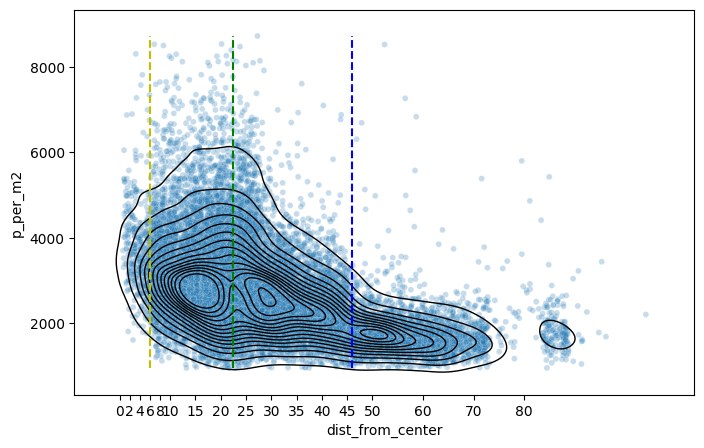

In [22]:
sns.kdeplot(df, x='dist_from_center', y='p_per_m2', color='k', linewidths=1, levels=15,)
sns.scatterplot(df, x='dist_from_center', y='p_per_m2', size=1, alpha=0.25, legend=False);
plt.xticks([0,2,4,6,8,10,15,20,25,30,35,40,45,50,60,70,80]);
# plt.vlines(x=[6, 22.5, 32.5, 46], ymin=df.p_per_m2.min(), ymax=df.p_per_m2.max(), 
#            linestyles='dashed', colors=['r', 'y', 'g', 'b']);
plt.vlines(x=[6, 22.5, 46], ymin=df.p_per_m2.min(), ymax=df.p_per_m2.max(), 
            linestyles='dashed', colors=['y', 'g', 'b']);

Alright, there are about four zones. The most central region (the leftmost tail on the KDE plot) tends to have higher prices than the other three regions further away from the center (bright points concentrated in the center on the map above); the third peak (which must be the southern area) lies already in the much lower price range (the dark blue dots prevail). 

Let's break the data up into this four zones and look at the qualitative tendencies

> Note: we make the linear fits with `seaborn.regplot` using the flag `robust=Ture`, which makes **the fit resistant to outliers**

In [23]:
## Variant of alternative assignment that's left here for quick comparison

# queries = ['dist_from_center <= 11', 
#            'dist_from_center > 11 and dist_from_center <= 22.5', 
#            'dist_from_center > 22.5 and dist_from_center <= 32.5', 
#            'dist_from_center > 32.5 and dist_from_center <= 45',
#            'dist_from_center > 45']
# colors_markers = ['lightcoral', 'bisque', 'palegreen', 'lightskyblue', 'gray']
# colors_lines = ['r', 'y', 'g', 'b', 'k']

# for query, cm, cl in zip(queries, colors_markers, colors_lines):
#   sns.regplot(df.query(query), 
#               x='dist_from_center', y='p_per_m2', 
#               robust=True, # This flag makes the liear fit being resistant to outliers
#               line_kws=dict(color=cl), 
#               scatter_kws=dict(color=cm, alpha=0.05),
#               marker="x", 
#             )
# plt.xlabel('Distance form the city center (km)')
# plt.ylabel('Price of a m² ($)');

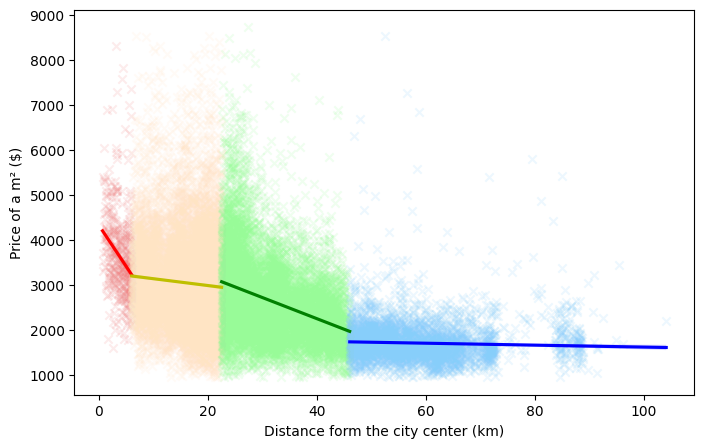

In [24]:
queries = ['dist_from_center <= 6', 
           'dist_from_center > 6 and dist_from_center <= 22.5', 
           'dist_from_center > 22.5 and dist_from_center <= 46', 
           'dist_from_center > 46']
colors_markers = ['lightcoral', 'bisque', 'palegreen', 'lightskyblue']
colors_lines = ['r', 'y', 'g', 'b']

for query, cm, cl in zip(queries, colors_markers, colors_lines):
  sns.regplot(df.query(query), 
              x='dist_from_center', y='p_per_m2', 
              robust=True, # This flag makes the liear fit being resistant to outliers
              line_kws=dict(color=cl), 
              scatter_kws=dict(color=cm, alpha=0.15),
              marker="x", 
            )
plt.xlabel('Distance form the city center (km)')
plt.ylabel('Price of a m² ($)');

* The price in the <span style="color:red">**first** </span> zone **highly depends on the location**. This zone is, however, out of scope of our interest;
* The price in the <span style="color:gold">**second** </span> zone **only slightly** depends on the proximity to the center, but it is not the dominant factor; 
* The price in the <span style="color:green">**third** </span> zone notably **drops with the distance**;
* The rural <span style="color:blue">**fourth** </span> zone is the cheapest overall (these are the southern and eastern towns). The proximity to Seattle **has no effect** anymore. 

## Apart from the location, what affects the price?

Let's take the zones of constant or almost constant price with respect to proximity and look, what affects it.

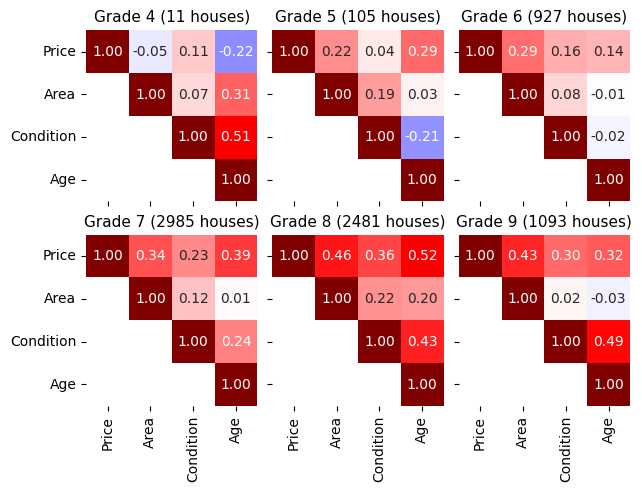

In [25]:
df_z2 = df.query('dist_from_center > 6 and dist_from_center <= 22.5') 

groups = df_z2[['price', 'm2_living', 'condition', 'age', 'grade']].groupby('grade')

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(6.5,5), sharex=True, sharey=True)
labels = ['Price', 'Area', 'Condition', 'Age']
for g, a in zip(range(4,10), axs.ravel()):
    corm = groups.get_group(g).drop('grade', axis=1).corr()
    a = plot_corr_matrix(corm, labels=labels, ax=a)
    a.set_title(f'Grade {g} ({groups.get_group(g).shape[0]} houses)', fontsize=11)
    a.grid(False)
plt.tight_layout()
plt.show()

Among the **central** houses:
* Price of the buildings of `grade 5` don't `age` well: their `condition` deteriorates
* The living `area` positively affects house price - starting from `grade 5` 
* `Condition` seems to positively affect the price only for buildings stronger for buildings of a `higher grades`, especially stating from `grade = 7`. 
* Houses of `grade 4` are not eligible for statistical analysis

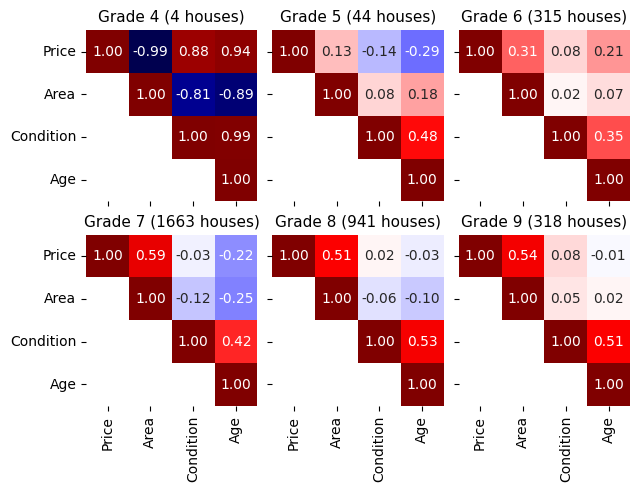

In [26]:
df_z4 = df.query('dist_from_center > 46') 
groups = df_z4[['price', 'm2_living', 'condition', 'age', 'grade']].groupby('grade')

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(6.5,5), sharex=True, sharey=True)
labels = ['Price', 'Area', 'Condition', 'Age']
for g, a in zip(range(4,10), axs.ravel()):
    corm = groups.get_group(g).drop('grade', axis=1).corr()
    a = plot_corr_matrix(corm, labels=labels, ax=a)
    a.set_title(f'Grade {g} ({groups.get_group(g).shape[0]} houses)', fontsize=11)
    a.grid(False)
plt.tight_layout()
plt.show()

Among the **rural** houses:
* Price of the buildings of `grade 5 and 7` is negatively affected by building's age. *Despite the fact that...*
* ...that houses of `any grade` do `age` well, and the older the house, the better its `condition` - *back in the days, they knew how to do things!* 
* `Condition` does not have an influence on price, or this effect is neglegible
* The living `area` positively affects house price - starting from `grade 6` 
* Houses of `grade 4` are not eligible for statistical analysis

> We just learned that house appreciation varies between the central urban and remote rural areas. This means, it makes sence to split the data set and analyse the urban and rural areas separately.

In [27]:
df_c = df.query('dist_from_center > 6 and dist_from_center <= 22.5')
df_m = df.query('dist_from_center > 22.5 and dist_from_center <= 46')
df_r = df.query('dist_from_center > 46')

Pearson coefficient only accounts for linear correlations. Let's examine the dependencies more closely.

*We'll exclude the luxorious houses as well as houses for which there is not enough data. Also, the super large lots are ommited (383 points)*

In [29]:
df_c[(df_c.m2_lot > 10000)].shape[0] + df_m[(df_m.m2_lot > 10000)].shape[0] + df_r[(df_r.m2_lot > 10000)].shape[0]

383

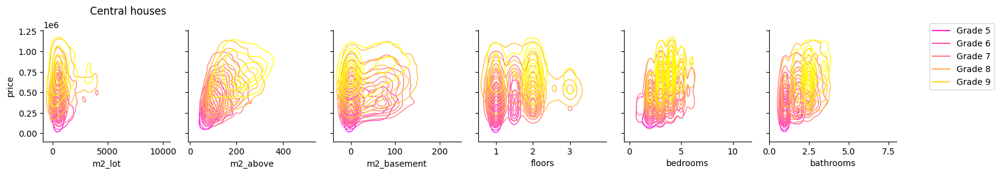

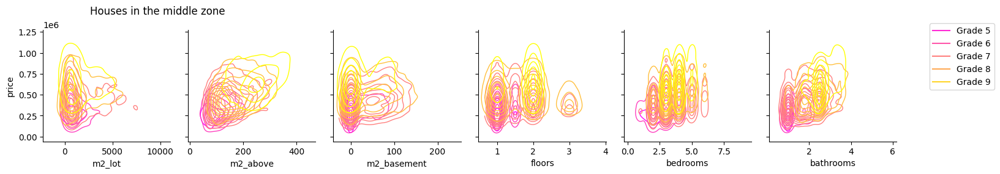

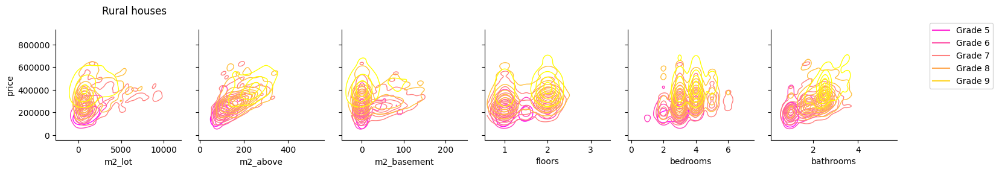

In [30]:
x_vars = ['m2_lot', 'm2_above', 'm2_basement', 'floors', 'bedrooms', 'bathrooms']
y_vars = ["price"]


## We'll exclude the luxorious houses as well as houses for which there is not enough data. Also, the super large lots are ommited (383 points)
fig_c = plot_feature_kde_row(df_c[(df_c.m2_lot < 10000) & (df_c.grade > 4) & (df_c.grade < 10)], 
                             x_vars, y_vars, hue='grade', 
                             cmap='spring',
                             title='Central houses')

fig_m = plot_feature_kde_row(df_m[(df_m.m2_lot < 10000) & (df_m.grade > 4) & (df_m.grade < 10)], 
                             x_vars, y_vars, hue='grade', 
                             cmap='spring',
                             title='Houses in the middle zone')

fig_r = plot_feature_kde_row(df_r[(df_r.m2_lot < 10000) & (df_r.grade > 4) & (df_r.grade < 10)], 
                             x_vars, y_vars, hue='grade', 
                             cmap='spring',
                             title='Rural houses')

All in all, distributions of the features **are quite similar across all house `grades`**. Despite the defferences in buiding aging and condition for urban and rural houses, **the price distributions are also similar for all considered zones**

* For the central those categories, house `grade` has a marginal influence 
* The **area has a strong effect on the `price`** 
    * And the presence and area of the `basement` does not make a difference

The price is also correlated with the number of `bedrooms` and `bathrooms`, but we know that the number of rooms generally increases with the livable space *(these features are collinear with the area)*.

Let's cancel the effect of the overall house area and investigate the influence of the house `condition`,  `age` and `grade` on the price of a square meter.

### Effect of the building `condition` on the `price of a square meter`

In [31]:
df_c['zone'] = 'central'
df_m['zone'] = 'mid'
df_r['zone'] = 'rural'

df1 = pd.concat([df_c, df_m, df_r])

In [32]:
df_cond = df1[['p_per_m2', 'price', 'grade', 'condition', 'zone']].groupby(['condition', 'zone']).mean()                        \
            .join(df1[['p_per_m2', 'price', 'grade', 'condition', 'zone']].groupby(['condition', 'zone']).std(), rsuffix='_std')
df_cond = df_cond.join(df1[['price', 'condition', 'zone']].groupby(['condition', 'zone']).count(), rsuffix='_count')
df_cond.rename({'price_count': 'count'}, axis=1, inplace=True)
df_cond.style.format(precision=1)

In [33]:
df_cond_c = df_cond.loc[pd.IndexSlice[:, 'central'], pd.IndexSlice[:]].droplevel(1)
df_cond_m = df_cond.loc[pd.IndexSlice[:, 'mid'], pd.IndexSlice[:]].droplevel(1)
df_cond_r = df_cond.loc[pd.IndexSlice[:, 'rural'], pd.IndexSlice[:]].droplevel(1)

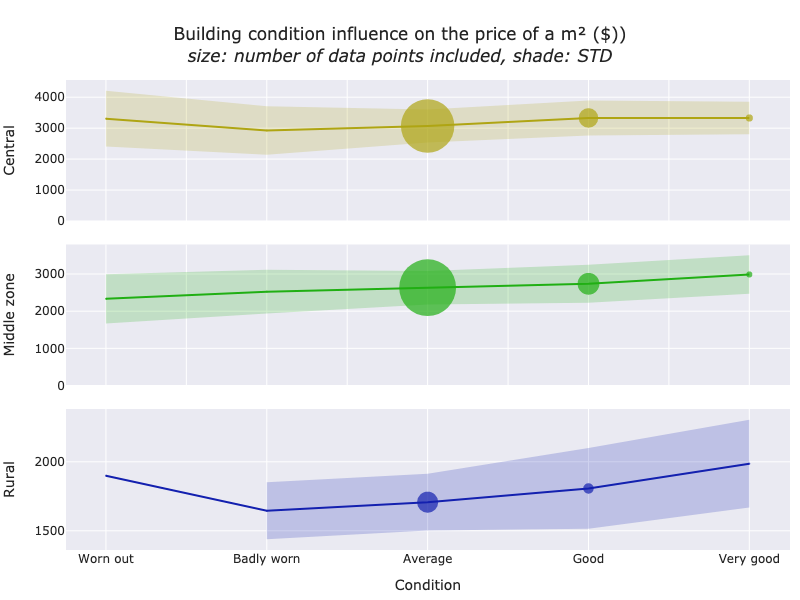

In [34]:
fig = sp.make_subplots(rows=3, shared_xaxes=True, vertical_spacing=0.05)

fig_c = filledline(df_cond_c, 'p_per_m2', 'p_per_m2_std', color='rgba(175, 165, 19, 1)')
fig_m = filledline(df_cond_m, 'p_per_m2', 'p_per_m2_std', color='rgba(32, 175, 19, 1)')
fig_r = filledline(df_cond_r, 'p_per_m2', 'p_per_m2_std', color='rgba(19, 32, 175, 1)')

for trace_c in fig_c.data:
      fig.add_trace(trace_c, row=1, col=1)

for trace_m in fig_m.data:
      fig.add_trace(trace_m, row=2, col=1)

for trace_r in fig_r.data:
      fig.add_trace(trace_r, row=3, col=1)

fig.update_layout(width=800, height=600,
                  title='Building condition influence on the price of a m² ($))<br><i>size: number of data points included, shade: STD</i>',
                  yaxis_title='Central', yaxis2_title='Middle zone', yaxis3_title='Rural',
                  xaxis3=dict(
                        title='Condition',
                        tickvals=[1, 2, 3, 4, 5],    
                        ticktext=['Worn out', 'Badly worn', 'Average', 'Good', 'Very good']
                        ), 
                  margin=dict(l=10, r=10, t=80, b=10),
                  template='seaborn')
fig.show()

> **The building `condition` marginally affects the `price of a square meter`**, the effect is stronger for the **rural areas**

Same analysis for the `grade`

In [35]:
df_grade = df1[['p_per_m2', 'price', 'grade', 'condition', 'zone']].groupby(['grade', 'zone']).mean()                        \
            .join(df1[['p_per_m2', 'price', 'grade', 'condition', 'zone']].groupby(['grade', 'zone']).std(), rsuffix='_std')
df_grade = df_grade.join(df1[['price', 'grade', 'zone']].groupby(['grade', 'zone']).count(), rsuffix='_count')
df_grade.rename({'price_count': 'count'}, axis=1, inplace=True)
df_grade.style.format(precision=1)

In [36]:
df_grade_c = df_grade.loc[pd.IndexSlice[:, 'central'], pd.IndexSlice[:]].droplevel(1)
df_grade_m = df_grade.loc[pd.IndexSlice[:, 'mid'], pd.IndexSlice[:]].droplevel(1)
df_grade_r = df_grade.loc[pd.IndexSlice[:, 'rural'], pd.IndexSlice[:]].droplevel(1)

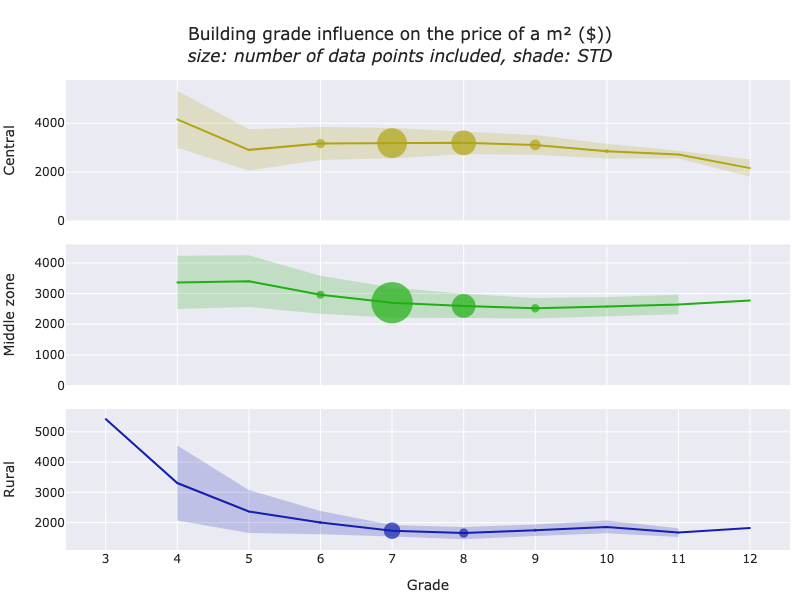

In [37]:
fig = sp.make_subplots(rows=3, shared_xaxes=True, vertical_spacing=0.05)

fig_c = filledline(df_grade_c, 'p_per_m2', 'p_per_m2_std', color='rgba(175, 165, 19, 1)')
fig_m = filledline(df_grade_m, 'p_per_m2', 'p_per_m2_std', color='rgba(32, 175, 19, 1)')
fig_r = filledline(df_grade_r, 'p_per_m2', 'p_per_m2_std', color='rgba(19, 32, 175, 1)')

for trace_c in fig_c.data:
      fig.add_trace(trace_c, row=1, col=1)

for trace_m in fig_m.data:
      fig.add_trace(trace_m, row=2, col=1)

for trace_r in fig_r.data:
      fig.add_trace(trace_r, row=3, col=1)

fig.update_layout(width=800, height=600,
                  title='Building grade influence on the price of a m² ($))<br><i>size: number of data points included, shade: STD</i>',
                  yaxis_title='Central', yaxis2_title='Middle zone', yaxis3_title='Rural',
                  xaxis3=dict(
                        title='Grade',
                        tickvals=[3, 4, 5, 6, 7, 7, 8, 9, 10, 11, 12],    
                        #ticktext=['Worn out', 'Badly worn', 'Average', 'Good', 'Very good']
                        ), 
                  margin=dict(l=10, r=10, t=80, b=10),
                  template='seaborn')
fig.show()

> **The building `grade` does not affect the `price of a square meter`**

<span style="color:#D32F2F"> This data shows that the square meter of a manson is the same as an ordinary good house </span>

Of course, the price drop with increase of the grade does not tell much: first, there are too few data points on the left end; second, a real reason can be that for some reason almost empty lots are sold at the price of a house

## The takeaways

Let's summarize what we know:
- The absolute `price of a square meter` is most affected by the proximity to the Seattle downtown but dips for particular areas (*George town*, *White city*) 
- The `price of a square meter` is **not** affected by building `grade`, `condition` or house features (floors, rooms, etc). 

But the living conditions can be increased together with the price by building up! For this, we *may* want to consider large `lots`.

* Focus on renovation may yield little to know return. This means, the object shoud have either a large appreciation portential and be cheap - and in a bad condition - or be already cheap enough. 

* When the low-quality neighborhoods can *potentially* be appreciated when renovated in bulk, in a very long term. This is a heavy-lifting strategy which requires a large budget and effort for dense *central* areas.

* However, when targeting a *rural* area with only a few houses close together, one can hope to make the area more prestigious at once much quicker. The price will however, inherently remain much lower than for the *central* areas.


It seems reasonable to focus on **two strategies**:

||Conservative|High risk / high reward|
|--:|:---|:---|
|➡️|Improve `condition` in the remote satellite towns | Building up the `footage` while / thereby upgrading the grade |
|🎯|Houses on the outskirts in average condition. Only minor renovations would be needed (rather, construction works), but the price will never be comparable to the central houses | Central houses where living situation can be improved by adding the square footage (e.g. by adding a floor). This is resource-demanding both in terms of the property price (high in Seattle) and in terms of the potential expences: materials and labor. However, doing a high-quality job here may bring high gains: there is a large price increase. |

**It seems like Erin's goals align most with the first, "conservative" strategy.  In the following, we will only develop that one.**

|✅ Conservative| ❌ High risk / high reward|
|:---|:---|
|Improve `condition` in the remote satellite towns | Building up the `footage` while / thereby upgrading the grade |

---

# Step 3. Generating specific investment recommendations

Given the acquired knowledge, let's select the best investment targets from the poor neighborhoods defined in the Step 1. 

>Now we know, that we have to targe those 45+ km away from Seattle Center.

In [38]:
dftr = pd.merge(df_r, dft[['id', 'poor_neighborhood_id']], on='id')

In [39]:
display(dftr.sample(3))
dftr.shape

,id,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,sale_date,price,basement_share,age,yrs_since_renovation,p_per_m2,dist_from_center,zone,poor_neighborhood_id
83,2781250560,2.0,2.0,111.482720,336.677815,2.0,0,0.0,3,6,111.482720,0.0,2003,NaN,98038,47.3490,-122.025,126.347083,250.185805,2014-12-02,234000.0,0.0,12,NaN,2099.0,53.916079,rural,13
73,1450100390,3.0,1.0,85.470085,679.487179,1.0,0,0.0,3,6,85.470085,0.0,1960,NaN,98002,47.2892,-122.220,93.831289,689.334820,2015-03-16,208000.0,0.0,55,NaN,2433.6,65.420848,rural,15
61,8945300090,3.0,1.0,138.424378,765.421776,1.0,0,0.0,4,6,138.424378,0.0,1963,NaN,98023,47.3060,-122.370,111.482720,786.882200,2014-08-11,205950.0,0.0,52,NaN,1487.8,62.859758,rural,25


(146, 28)

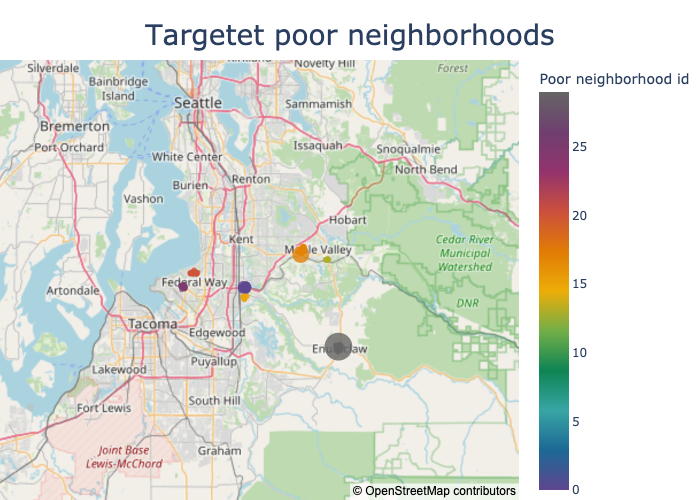

In [40]:
geoplot(dftr, size_col='grade', color_col='poor_neighborhood_id', title='Targeted poor neighborhoods', 
                     marker_max_size=20, colorscheme=px.colors.qualitative.Prism, alpha=0.8)

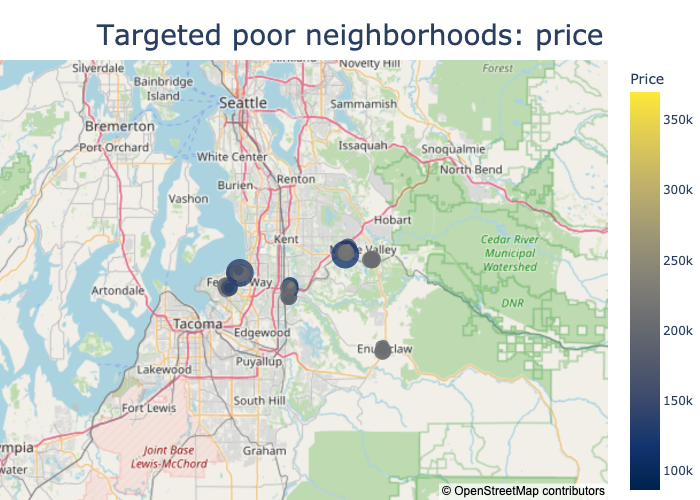

In [41]:
fig = geoplot(dftr, size_col='condition', color_col='price', title='Targeted poor neighborhoods: price', 
                     marker_max_size=20, colorscheme=px.colors.sequential.Cividis, alpha=0.8)
fig.update_traces(hovertemplate='ID: ' + dftr['id'].astype(str))

To narrow down the selection even further, we can identify the units in the worst condition, which are underpriced in comparison to the cluster average.

> Side note: There are a few really underpriced properties, too, which do not require restoration! 
>
> Take 
> * 9320900420
> * 9320901250
> * 1921059235
> * 8651402750

In [42]:
idx_least = dftr[['poor_neighborhood_id', 'p_per_m2']].groupby('poor_neighborhood_id').idxmin().values
subselect = dftr.loc[idx_least.reshape(-1,)]
final_selection = subselect.query('condition < 4')

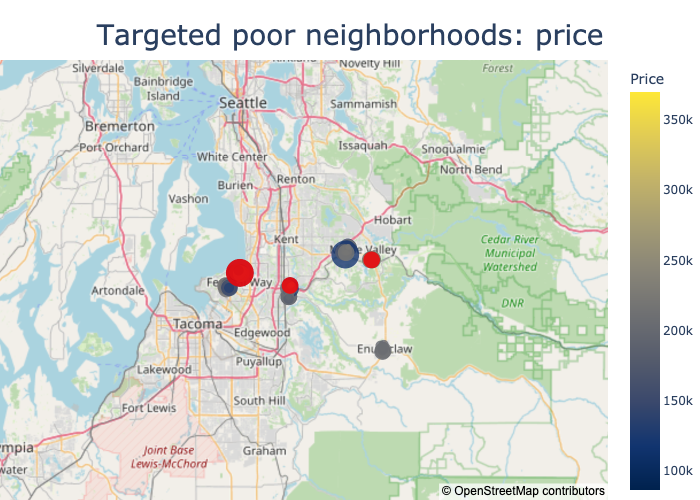

In [43]:
fig = geoplot(dftr, size_col='condition', color_col='price', title='Targeted poor neighborhoods: price', 
                     marker_max_size=20, colorscheme=px.colors.sequential.Cividis, alpha=0.8)
fig1 = geoplot(final_selection, size_col='condition', color_col='price', title='Targeted poor neighborhoods: price', 
                     marker_max_size=20, colorscheme=px.colors.sequential.Reds, alpha=0.8)
fig1.update_traces(marker_color='red')
#fig.update_traces(hovertemplate='ID: ' + dftr['id'].astype(str))
fig.add_traces(fig1.data[0])
fig

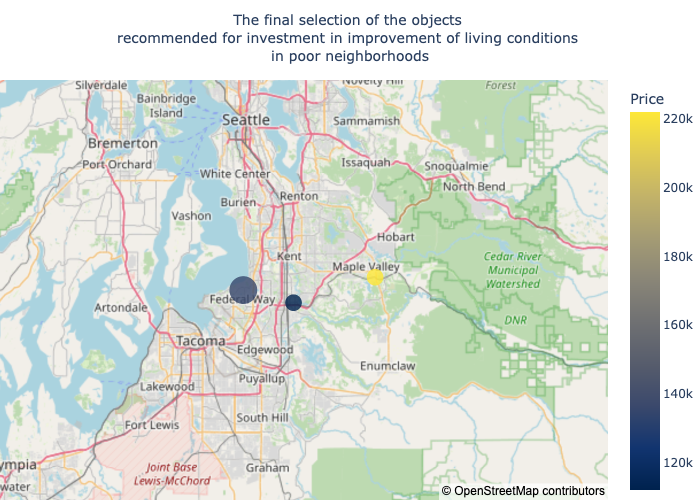

In [44]:
fig = geoplot(final_selection, size_col='condition', color_col='price', title='The final selection of the objects <br>recommended for investment in improvement of living conditions <br>in poor neighborhoods', 
                     marker_max_size=20, colorscheme=px.colors.sequential.Cividis, alpha=0.8)
fig.update_layout(title_font_size=14, margin={'t': 80})

In [45]:
final_selection

,id,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,sale_date,price,basement_share,age,yrs_since_renovation,p_per_m2,dist_from_center,zone,poor_neighborhood_id
69,2648500030,1.0,1.0,100.334448,300.074322,1.0,0,0.0,3,6,100.334448,0.000000,1963,NaN,98002,47.3075,-122.217,112.411743,535.117057,2014-07-25,112000.0,0.000000,52,NaN,1116.3,61.348781,rural,0
24,2781250750,2.0,2.0,126.347083,306.577480,2.0,0,0.0,3,6,126.347083,0.000000,2004,NaN,98038,47.3489,-122.022,121.701970,306.577480,2014-08-28,222000.0,0.000000,11,NaN,1757.1,53.995774,rural,13
91,5560000650,3.0,1.0,141.211446,785.024155,1.0,0,0.0,2,6,104.050539,37.160907,1961,NaN,98023,47.3280,-122.337,122.630992,785.024155,2014-12-02,135000.0,0.263158,54,NaN,956.0,57.599343,rural,20


# Conclusion

We analyzed the influence of the price on 
We selected a few objects that may interest our client:

* 2648500030
* 2781250750
* 5560000650

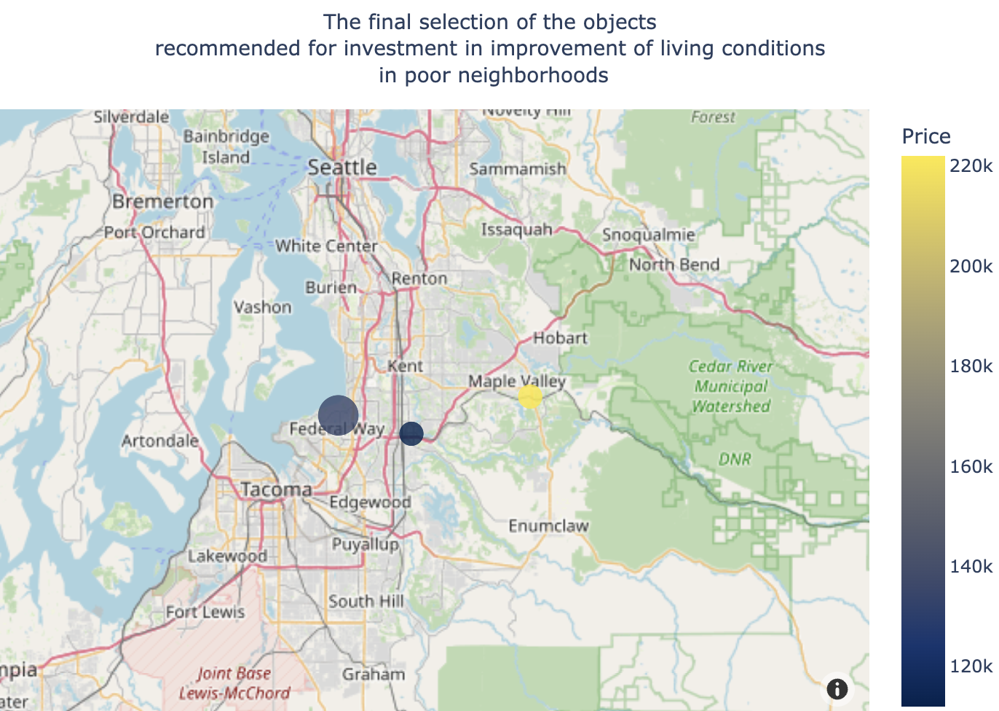

# ==========================================

# Fin